In [1]:
##### This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load
# I found that the eeg_recording28 doesn't have enough data,the date for drowsy is only 76800.

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import scipy.io
import matplotlib.pyplot as plt
import os
from scipy import signal
from scipy.fft import fft, fftshift

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

file_names=[]
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        file_names.append(os.path.join(dirname, filename))
        #print(os.path.join(dirname, filename))
        
#print(file_names)
# each trial is about 54 mins


dict_keys(['eeg_record25', 'eeg_record26', 'eeg_record17', 'eeg_record3', 'eeg_record20', 'eeg_record13', 'eeg_record14', 'eeg_record10', 'eeg_record21', 'eeg_record19', 'eeg_record4', 'eeg_record18', 'eeg_record33', 'eeg_record27', 'eeg_record32', 'eeg_record24', 'eeg_record11', 'eeg_record6', 'eeg_record31', 'eeg_record12', 'eeg_record7', 'eeg_record5', 'eeg_record34'])

In [2]:
# build 5 order high pass filter
from scipy.signal import butter, lfilter, freqz   
# ----- ----- ----- -----    
def butter_highpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = signal.butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def butter_highpass_filter(data, cutoff, fs, order=5):
    b, a = butter_highpass(cutoff, fs, order=order)
    x = signal.filtfilt(b, a, data)
    y = signal.filtfilt(b, a, x)
    return y


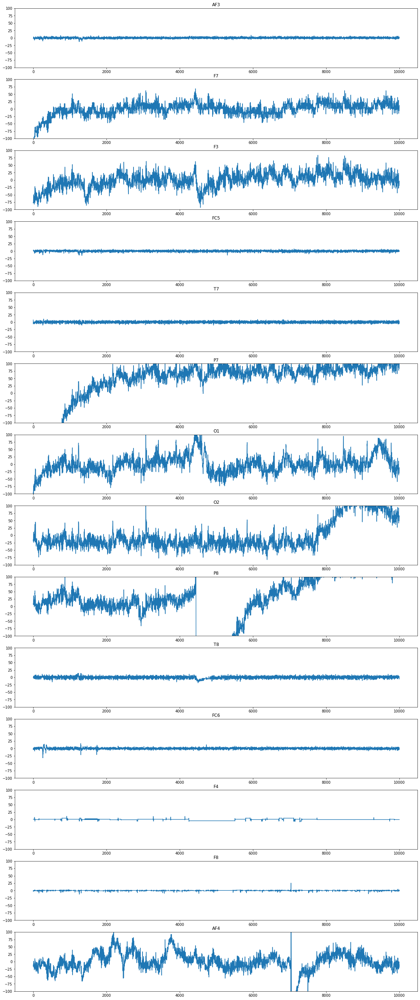

In [3]:
#starting from Channel 3,/0,1,2,3
# The introduction of the data set in kaggle doesn't provide enough information.
#And we don't know which data are useful I have to plot all the channels.
#There are 14 channels, but the experimenter modified the headset.
#after removing the DC, the EEG amplitude should be around (-100,100).
#According to the plot, I think ['F7','F3','P7','O1','O2','P8','AF4'] are useful channels.
fig, ax = plt.subplots(14,1)
fig.set_figwidth(20)
fig.set_figheight(50)
#fig.set_size_inches(10,10)
mat = scipy.io.loadmat(file_names[0])
data = mat['o']['data'][0,0]
FS = mat['o']['sampFreq'][0][0][0][0]
channels = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']
for i in range(14):
    data_ave = data[5000:15000,i+3]-np.mean(data[5000:15000,i+3])
    ax[i].plot(data_ave)
    ax[i].set_title(channels[i])
    ax[i].set_ylim(-100,100)
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

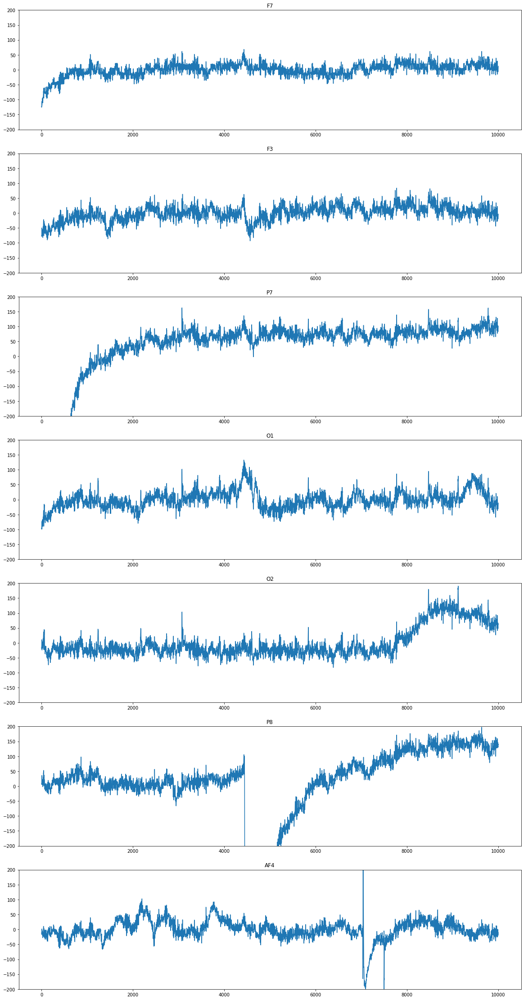

In [4]:
#F7,F3,P7,O1,O2,P8,AF4
useful_channels=[4,5,8,9,10,11,16]
useful_channels_names=['F7','F3','P7','O1','O2','P8','AF4']
fig,ax = plt.subplots(7)
fig.set_size_inches(20,40)
j=0
for i in useful_channels:
    data_ave = data[5000:15000,i]-np.mean(data[5000:15000,i])
    ax[j].plot(data_ave)
    ax[j].set_ylim(-200,200)
    ax[j].set_title(channels[i-3])
    j=j+1

focus data from 0-10 mins,unfocus data from 10_20 mins, and drowsy 20-30 mins
The first two files is the data of practicing, so I am going to use the last 5 files from each participant.
There are 24 files expect the subject 5 can't record his 7th recording.

In [5]:
marker=128*60*10
#delete file #28 because it doesnot have enough data
useful_file_index = [3,4,5,6,7,10,11,12,13,14,17,18,19,20,21,24,25,26,27,31,32,33,34]
#useful_file_index = np.arange(1,35)
chan_num=7
trail_names=[]
data_focus={}
data_unfocus={}
data_drowsy={}
focus={}
unfocus={}
drowsy={}
#for i in useful_file_index:
i=1
for index,filename in enumerate(filenames):
    if int(filename.split('d')[1].split('.')[0]) in useful_file_index:
        mat = scipy.io.loadmat(file_names[index])
        trail_names.append(filename.split('.')[0])
        data_focus[trail_names[-1]]=mat['o']['data'][0,0][0:marker,useful_channels].copy()
        data_unfocus[trail_names[-1]]=mat['o']['data'][0,0][marker:2*marker,useful_channels].copy()
        data_drowsy[trail_names[-1]]=mat['o']['data'][0,0][2*marker:3*marker,useful_channels].copy()
        focus[trail_names[-1]]=mat['o']['data'][0,0][0:marker,useful_channels].copy()
        unfocus[trail_names[-1]]=mat['o']['data'][0,0][marker:2*marker,useful_channels].copy()
        drowsy[trail_names[-1]]=mat['o']['data'][0,0][2*marker:3*marker,useful_channels].copy()

In [6]:
data_focus.keys()

dict_keys(['eeg_record25', 'eeg_record26', 'eeg_record17', 'eeg_record3', 'eeg_record20', 'eeg_record13', 'eeg_record14', 'eeg_record10', 'eeg_record21', 'eeg_record19', 'eeg_record4', 'eeg_record18', 'eeg_record33', 'eeg_record27', 'eeg_record32', 'eeg_record24', 'eeg_record11', 'eeg_record6', 'eeg_record31', 'eeg_record12', 'eeg_record7', 'eeg_record5', 'eeg_record34'])

In [7]:
data_focus['eeg_record3']

array([[3804.1025641 , 5210.76923077, 4490.76923077, ..., 3511.79487179,
        4321.02564103, 4024.1025641 ],
       [3796.41025641, 5205.64102564, 4489.23076923, ..., 3505.12820513,
        4311.79487179, 4017.94871795],
       [3798.97435897, 5207.17948718, 4489.23076923, ..., 3511.79487179,
        4313.84615385, 4018.97435897],
       ...,
       [3751.79487179, 5245.12820513, 4540.51282051, ..., 3495.38461538,
        4321.02564103, 4151.28205128],
       [3738.46153846, 5231.28205128, 4525.64102564, ..., 3487.69230769,
        4304.1025641 , 4134.87179487],
       [3723.58974359, 5217.94871795, 4519.48717949, ..., 3481.53846154,
        4291.79487179, 4125.64102564]])

In [8]:
# High Pass 0.16HZ
row, col = data_focus['eeg_record3'].shape
for name in trail_names:
    for i in range(col):
        data_focus[name][:,i]=butter_highpass_filter(data_focus[name][:,i], 0.16, 128, 5)
        data_unfocus[name][:,i]=butter_highpass_filter(data_unfocus[name][:,i], 0.16, 128, 5)
        data_drowsy[name][:,i]=butter_highpass_filter(data_drowsy[name][:,i], 0.16, 128, 5)
        #print(name,data_drowsy[name][:,i].shape)

In [9]:
feature_names = []
freq_range=np.arange(0.5,18.5,0.5)
symb='_'
#useful_channels_names=['F7','F3','P7','O1','O2','P8','AF4']
for index,channel in enumerate(useful_channels_names):
    for freq in freq_range:
        feature_names.append(channel+symb+str(freq))
feature_names

['F7_0.5',
 'F7_1.0',
 'F7_1.5',
 'F7_2.0',
 'F7_2.5',
 'F7_3.0',
 'F7_3.5',
 'F7_4.0',
 'F7_4.5',
 'F7_5.0',
 'F7_5.5',
 'F7_6.0',
 'F7_6.5',
 'F7_7.0',
 'F7_7.5',
 'F7_8.0',
 'F7_8.5',
 'F7_9.0',
 'F7_9.5',
 'F7_10.0',
 'F7_10.5',
 'F7_11.0',
 'F7_11.5',
 'F7_12.0',
 'F7_12.5',
 'F7_13.0',
 'F7_13.5',
 'F7_14.0',
 'F7_14.5',
 'F7_15.0',
 'F7_15.5',
 'F7_16.0',
 'F7_16.5',
 'F7_17.0',
 'F7_17.5',
 'F7_18.0',
 'F3_0.5',
 'F3_1.0',
 'F3_1.5',
 'F3_2.0',
 'F3_2.5',
 'F3_3.0',
 'F3_3.5',
 'F3_4.0',
 'F3_4.5',
 'F3_5.0',
 'F3_5.5',
 'F3_6.0',
 'F3_6.5',
 'F3_7.0',
 'F3_7.5',
 'F3_8.0',
 'F3_8.5',
 'F3_9.0',
 'F3_9.5',
 'F3_10.0',
 'F3_10.5',
 'F3_11.0',
 'F3_11.5',
 'F3_12.0',
 'F3_12.5',
 'F3_13.0',
 'F3_13.5',
 'F3_14.0',
 'F3_14.5',
 'F3_15.0',
 'F3_15.5',
 'F3_16.0',
 'F3_16.5',
 'F3_17.0',
 'F3_17.5',
 'F3_18.0',
 'P7_0.5',
 'P7_1.0',
 'P7_1.5',
 'P7_2.0',
 'P7_2.5',
 'P7_3.0',
 'P7_3.5',
 'P7_4.0',
 'P7_4.5',
 'P7_5.0',
 'P7_5.5',
 'P7_6.0',
 'P7_6.5',
 'P7_7.0',
 'P7_7.5',
 'P7_8.0'

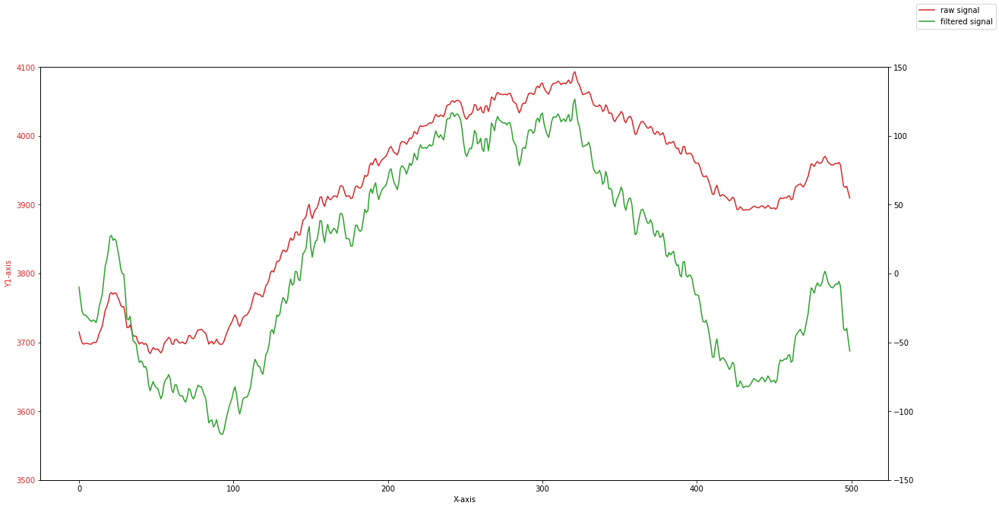

In [10]:
#validate the high pass filter
fig,ax = plt.subplots(1)
fig.set_size_inches(20,10)
color = 'tab:red'
ax.set_xlabel('X-axis')
ax.set_ylabel('Y1-axis', color = color)
ax.plot(unfocus['eeg_record3'][0:500,0], color = color,label='raw signal')
ax.tick_params(axis ='y', labelcolor = color)
ax.set_ylim(3500,4100)
# Adding Twin Axes to plot using dataset_2
ax0 = ax.twinx()
color = 'tab:green'
ax0.plot(data_unfocus['eeg_record3'][0:500,0],color=color,label='filtered signal')
ax0.set_ylim(-150,150)
fig.legend()
plt.show()

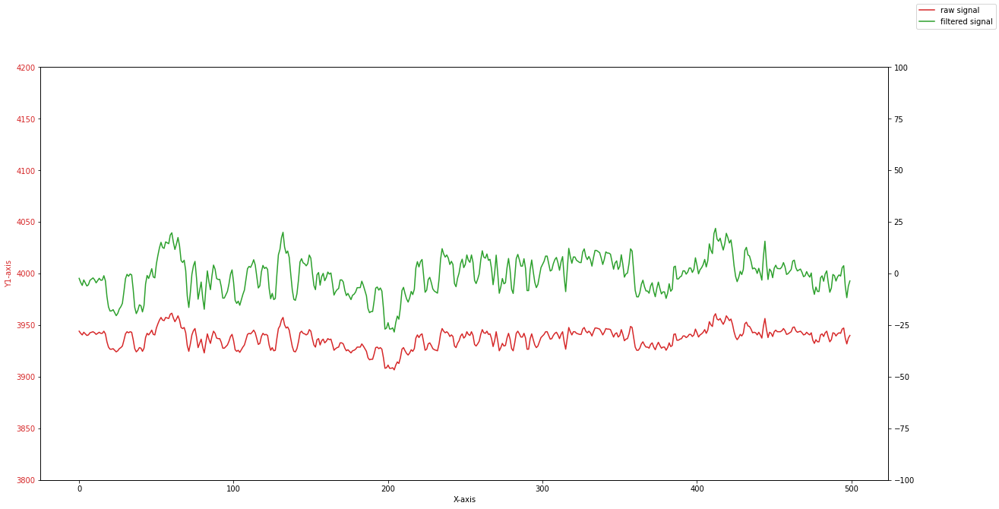

In [11]:
#validate the high pass filter
fig,ax = plt.subplots(1)
fig.set_size_inches(20,10)
color = 'tab:red'
ax.set_xlabel('X-axis')
ax.set_ylabel('Y1-axis', color = color)
ax.plot(unfocus['eeg_record33'][0:500,0], color = color,label='raw signal')
ax.tick_params(axis ='y', labelcolor = color)
ax.set_ylim(3800,4200)
# Adding Twin Axes to plot using dataset_2
ax0 = ax.twinx()
color = 'tab:green'
ax0.plot(data_unfocus['eeg_record33'][0:500,0],color=color,label='filtered signal')
ax0.set_ylim(-100,100)
fig.legend()
plt.show()

dict_keys(['eeg_record25', 'eeg_record26', 'eeg_record17', 'eeg_record3', 'eeg_record20', 'eeg_record13', 'eeg_record14', 'eeg_record10', 'eeg_record21', 'eeg_record19', 'eeg_record4', 'eeg_record18', 'eeg_record33', 'eeg_record27', 'eeg_record32', 'eeg_record24', 'eeg_record11', 'eeg_record6', 'eeg_record31', 'eeg_record12', 'eeg_record7', 'eeg_record5', 'eeg_record34'])

In [12]:
# STFT was then calculated at a time step of 1 s producing a set of time-varying DFT 
# amplitudes X STFT (t,ω) at 1s intervals within each input EEG channel.
t_win = np.arange(0,128)
M = 128
window_blackman=0.42-0.5*np.cos((2*np.pi*t_win)/(M-1))+0.08*np.cos((4*np.pi*t_win)/(M-1))#window_blackman = signal.windows.blackmanharris(128)

#col is 7
power_focus = {}
for name in trail_names:
    power_focus[name]=np.zeros([col,513,601])
    
power_unfocus = {}
for name in trail_names:
    power_unfocus[name]=np.zeros([col,513,601])
    
power_drowsy = {}
for name in trail_names:
    power_drowsy[name]=np.zeros([col,513,601])

#the output of the stft is 513*601,1 second data will produce 1 column of data,there are 601
for name in trail_names:
    for i in range(col):
        f, t,y1=scipy.signal.stft(data_focus[name][:,i],fs=128, window=window_blackman, nperseg=128, 
                      noverlap=0, nfft=1024, detrend=False,return_onesided=True, boundary='zeros',
                      padded=True)
        f, t,y2=scipy.signal.stft(data_unfocus[name][:,i],fs=128, window=window_blackman, nperseg=128, 
                      noverlap=0, nfft=1024, detrend=False,return_onesided=True, boundary='zeros',
                      padded=True)
        f, t,y3=scipy.signal.stft(data_drowsy[name][:,i],fs=128, window=window_blackman, nperseg=128, 
                      noverlap=0, nfft=1024, detrend=False,return_onesided=True, boundary='zeros',
                      padded=True)
        power_focus[name][i,:,:]=(np.abs(y1))**2
        power_unfocus[name][i,:,:]=(np.abs(y2))**2
        power_drowsy[name][i,:,:]=(np.abs(y3))**2



In [13]:
print(power_focus['eeg_record3'][0,:,:])

[[1.39349613e+03 1.00111530e+03 1.00122401e+04 ... 1.76895559e+02
  6.14390962e+02 3.18781338e+01]
 [1.38563558e+03 1.13765840e+03 9.84308804e+03 ... 1.73691882e+02
  6.05231971e+02 3.19566584e+01]
 [1.36231121e+03 1.53022120e+03 9.35128424e+03 ... 1.64389051e+02
  5.78552687e+02 3.21865814e+01]
 ...
 [1.52670534e-01 7.40087229e+00 1.93032096e-04 ... 3.42225399e-04
  1.91211100e-04 1.19623531e-02]
 [1.52114561e-01 7.39912208e+00 1.92342148e-04 ... 3.29425360e-04
  1.55540177e-04 1.20020818e-02]
 [1.51927069e-01 7.39853221e+00 1.92061361e-04 ... 3.25076206e-04
  1.43484022e-04 1.20156137e-02]]


In [14]:
print(power_focus['eeg_record3'][1,:,:])

[[8.62182232e+02 1.88581617e+04 2.47466288e+04 ... 5.00686856e+00
  6.21335201e+03 1.15526027e+03]
 [8.58237155e+02 1.86243307e+04 2.44007823e+04 ... 7.35226542e+00
  6.15189414e+03 1.15011165e+03]
 [8.46510277e+02 1.79395129e+04 2.33902672e+04 ... 1.40512352e+01
  5.97093250e+03 1.13481142e+03]
 ...
 [3.64220993e-01 9.24503186e-03 5.64644342e-05 ... 3.52515188e-04
  9.34355783e-04 7.70392381e-02]
 [3.63926273e-01 9.01138790e-03 5.49045496e-05 ... 3.42411665e-04
  9.28262806e-04 7.72468052e-02]
 [3.63826683e-01 8.93225287e-03 5.43422089e-05 ... 3.38993048e-04
  9.26182017e-04 7.73175020e-02]]


In [15]:
power_focus['eeg_record33'][0,:,:]

array([[7.34765842e+01, 2.39238037e-01, 4.29062746e+00, ...,
        3.20644506e+01, 7.03710914e+00, 1.64806047e-01],
       [7.31368318e+01, 6.22760564e-01, 4.31889395e+00, ...,
        3.19469050e+01, 7.19796829e+00, 1.72937038e-01],
       [7.21263593e+01, 1.73637594e+00, 4.39711037e+00, ...,
        3.16014819e+01, 7.66431174e+00, 1.96983147e-01],
       ...,
       [1.13837907e-02, 8.00625654e-04, 1.55224923e-05, ...,
        2.14525368e-03, 1.93728468e-03, 1.67452236e-04],
       [1.13932175e-02, 8.41483511e-04, 1.39382050e-05, ...,
        2.21459709e-03, 1.95051590e-03, 1.71466960e-04],
       [1.13963108e-02, 8.55482781e-04, 1.34386961e-05, ...,
        2.23831567e-03, 1.95468768e-03, 1.72817599e-04]])

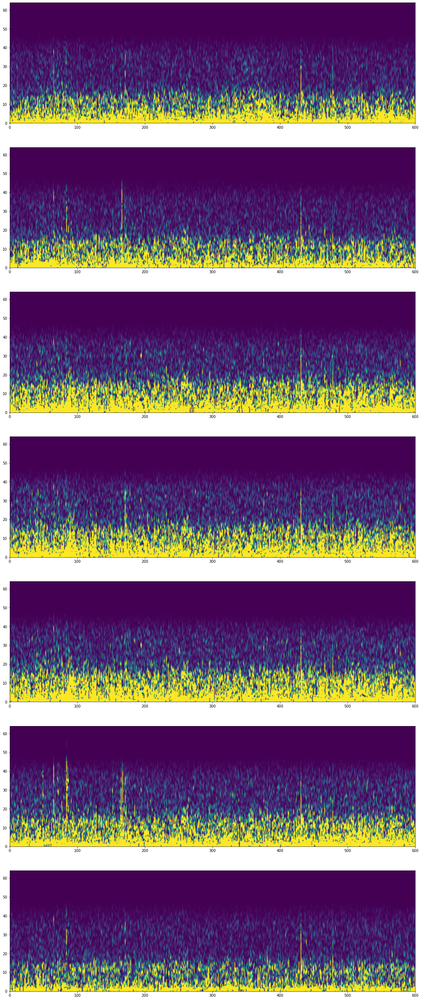

In [16]:
#validate the power value
fig,ax = plt.subplots(col,1)
fig.set_size_inches(20,50)
for i in range(col):
    ax[i].pcolormesh(t, f, power_focus['eeg_record18'][i,:,:],vmin=0, vmax=2*np.sqrt(2), shading='gouraud')

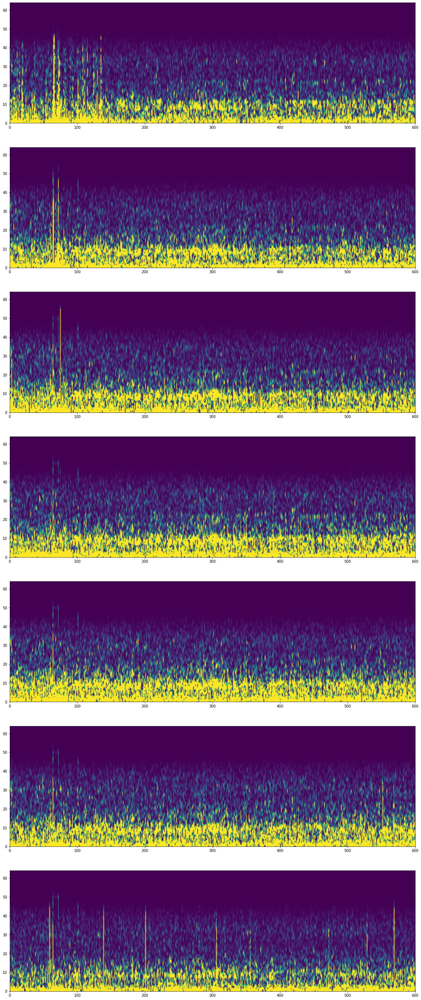

In [17]:
fig,ax = plt.subplots(col,1)
fig.set_size_inches(20,50)
for i in range(col):
    ax[i].pcolormesh(t, f, power_focus['eeg_record33'][i,:,:],vmin=0, vmax=2*np.sqrt(2), shading='gouraud')

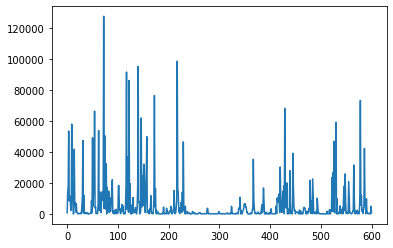

In [18]:
plt.plot(power_focus['eeg_record3'][2,1,:])

In [19]:
# combine bins into 0.5HZ, and keep 0-18 HZ.

num=[]

power_focus_bin = {}
for name in trail_names:
    power_focus_bin[name]=np.zeros([7,36,601])
    
power_unfocus_bin = {}
for name in trail_names:
    power_unfocus_bin[name]=np.zeros([7,36,601])
    
power_drowsy_bin = {}
for name in trail_names:
    power_drowsy_bin[name]=np.zeros([7,36,601])

for name in trail_names:
    for chn in range(col):
        j=0
        for i in range(1,144,4):
            power_focus_bin[name][chn,j,:]=np.average(power_focus[name][chn,i:i+4,:],axis=0)
            power_unfocus_bin[name][chn,j,:]=np.average(power_unfocus[name][chn,i:i+4,:],axis=0)
            power_drowsy_bin[name][chn,j,:]=np.average(power_drowsy[name][chn,i:i+4,:],axis=0)
            #print(np.average(power_drowsy[name][chn,i:i+4,:],axis=0).shape)
            #if name=='eeg_record3':
            #    if chn==0:
            #        num.append((f[i:i+4]))
            #    print(j)
            j=j+1
            
#print(num)    
#print(len(num))

In [20]:
# avarage over 15 seconds running window.

power_focus_ave = {}
for name in trail_names:
    power_focus_ave[name]=np.zeros([7,36,585])
    
power_unfocus_ave = {}
for name in trail_names:
    power_unfocus_ave[name]=np.zeros([7,36,585])
    
power_drowsy_ave = {}
for name in trail_names:
    power_drowsy_ave[name]=np.zeros([7,36,585])

for name in trail_names:
    for chn in range(col):
        j=0
        for k in range(0,585):
            power_focus_ave[name][chn,:,j]=np.average(power_focus_bin[name][chn,:,k:k+15],axis=1)
            power_unfocus_ave[name][chn,:,j]=np.average(power_unfocus_bin[name][chn,:,k:k+15],axis=1)
            power_drowsy_ave[name][chn,:,j]=np.average(power_drowsy_bin[name][chn,:,k:k+15],axis=1)
            #print(np.average(power_drowsy_bin[name][chn,:,k:k+15],axis=1).shape)
            j=j+1

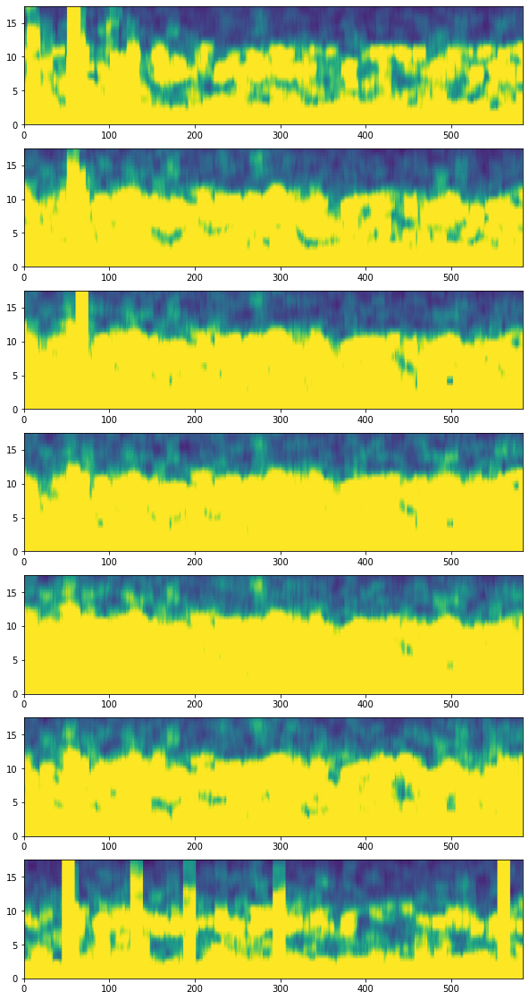

In [21]:
fig,ax = plt.subplots(col,1)
t1=np.arange(0,585)
f1=np.arange(0,18,0.5)
fig.set_size_inches(10,20)
for i in range(col):
    ax[i].pcolormesh(t1, f1, power_focus_ave['eeg_record33'][i,:,:],vmin=0, vmax=2*np.sqrt(2), shading='gouraud')

In [22]:
# Turn the data into a vector 
#[252,585]

svm_focus = {}
for name in trail_names:
    svm_focus[name]=np.zeros([252,585])
    
svm_unfocus = {}
for name in trail_names:
    svm_unfocus[name]=np.zeros([252,585])
    
svm_drowsy = {}
for name in trail_names:
    svm_drowsy[name]=np.zeros([252,585])

for name in trail_names:
    for j in range(585):      
        svm_focus[name][:,j]=power_focus_ave[name][:,:,j].reshape(1,-1)
        svm_unfocus[name][:,j]=power_unfocus_ave[name][:,:,j].reshape(1,-1)
        svm_drowsy[name][:,j]=power_drowsy_ave[name][:,:,j].reshape(1,-1)
    svm_focus[name]=10*np.log(svm_focus[name])
    svm_unfocus[name]=10*np.log(svm_unfocus[name])
    svm_drowsy[name]=10*np.log(svm_drowsy[name])
# now, we get the svm vector 252*585 252 rows


In [23]:
svm_focus['eeg_record33'].shape

(252, 585)

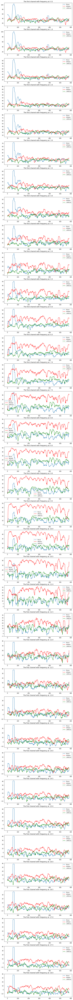

In [24]:
# along the horizontal direction ,it shows one channel at specific frequecy changes with time.
# each channel has 36 rows of data, 
# the following shows 7 channels, each with 36 slots of frequency.
fig,ax = plt.subplots(36,1)
fig.set_size_inches(10,150)
for i in range(36):
    ax[i].plot(svm_focus['eeg_record33'][i,:],label='focus')
    ax[i].plot(svm_drowsy['eeg_record33'][i,:],c='r',label='drowsy')
    ax[i].plot(svm_unfocus['eeg_record33'][i,:],c='green',label='unfocus')
    ax[i].legend()
    ax[i].set_title("The first channel with Frequency at: "+ str((i+1)*0.5) )

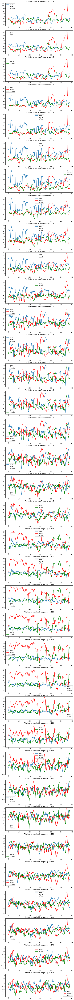

In [25]:
# along the horizontal direction ,it shows one channel at specific frequecy changes with time.
# each channel has 36 rows of data, 
# the following shows 7 channels, each with 36 slots of frequency.
fig,ax = plt.subplots(36,1)
fig.set_size_inches(10,150)
for i in range(36):
    ax[i].plot(svm_focus['eeg_record5'][i,:],label='focus')
    ax[i].plot(svm_drowsy['eeg_record5'][i,:],c='r',label='drowsy')
    ax[i].plot(svm_unfocus['eeg_record5'][i,:],c='green',label='unfocus')
    ax[i].legend()
    ax[i].set_title("The first channel with Frequency at: "+ str((i+1)*0.5) )

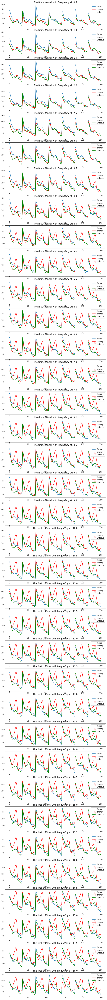

In [26]:
fig,ax = plt.subplots(36,1)
fig.set_size_inches(10,100)
#at a specific time, each channel changes with frequency
for i in range(36):
    ax[i].plot(svm_focus['eeg_record33'][:,i],label='focus')
    ax[i].plot(svm_drowsy['eeg_record33'][:,i],c='r',label='drowsy')
    ax[i].plot(svm_unfocus['eeg_record33'][:,i],c='green',label='unfocus')
    ax[i].legend()
    ax[i].set_title("The first channel with Frequency at: "+ str((i+1)*0.5) )
# the peak is at the lowest frequency.
#Each peak is the start of the data.

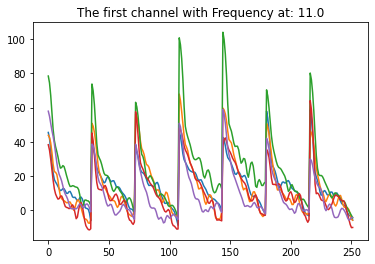

In [27]:
#at a specific time, each channel changes with frequency
for i in range(0,25,5):
    plt.plot(svm_focus[trail_names[i]][:,1])
# the peak is at the lowest frequency.
#Each peak is the start of the data.
plt.title("The first channel with Frequency at: "+ str((21+1)*0.5))
plt.show()

In [28]:
#--------0
label_focus = [0]*585
#--------1
label_unfocus = [1]*585
#--------2
label_drowsy = [2]*585

#subject is the variable for all participants

subj1_files={'eeg_record3','eeg_record4','eeg_record5','eeg_record6','eeg_record7'}
subj2_files={'eeg_record10','eeg_record11','eeg_record12','eeg_record13','eeg_record14'}
subj3_files={'eeg_record17','eeg_record18','eeg_record19','eeg_record20','eeg_record21'}
subj4_files={'eeg_record24','eeg_record25','eeg_record26','eeg_record27'}
subj5_files={'eeg_record31','eeg_record32','eeg_record33','eeg_record34'}


useful_file_index = [3,4,5,6,7,10,11,12,13,14,17,18,19,20,21,24,25,26,27,31,32,33,34]

In [29]:
# I will try to use the data from all participants to train the model
target=[]
subj=np.array([]).reshape(252,0).copy()
for name in trail_names:
    subj=np.concatenate((subj,svm_focus[name]), axis=1)
    subj=np.concatenate((subj,svm_unfocus[name]), axis=1)
    subj=np.concatenate((subj,svm_drowsy[name]), axis=1)  
    target = target+label_focus+label_unfocus+label_drowsy
subj=subj.T
target = np.array(target)

In [30]:
subj.shape

(40365, 252)

In [31]:
# This part I only train the data for subject1
target1=[]
subj1=np.array([]).reshape(252,0).copy()
for name in subj1_files:
    subj1=np.concatenate((subj1,svm_focus[name]), axis=1)
    subj1=np.concatenate((subj1,svm_unfocus[name]), axis=1)
    subj1=np.concatenate((subj1,svm_drowsy[name]), axis=1)  
    target1 = target1+label_focus+label_unfocus+label_drowsy
subj1=subj1.T
target1 = np.array(target1)

In [32]:
print(subj1.shape)
print(len(target1))

(8775, 252)
8775


In [33]:
target2=[]
subj2=np.array([]).reshape(252,0).copy()
for name in subj2_files:
    subj2=np.concatenate((subj2,svm_focus[name]), axis=1)
    subj2=np.concatenate((subj2,svm_unfocus[name]), axis=1)
    subj2=np.concatenate((subj2,svm_drowsy[name]), axis=1)  
    target2 = target2+label_focus+label_unfocus+label_drowsy
subj2=subj2.T
target2 = np.array(target2)

In [34]:
target3=[]
subj3=np.array([]).reshape(252,0).copy()
for name in subj3_files:
    subj3=np.concatenate((subj3,svm_focus[name]), axis=1)
    subj3=np.concatenate((subj3,svm_unfocus[name]), axis=1)
    subj3=np.concatenate((subj3,svm_drowsy[name]), axis=1)  
    target3 = target3+label_focus+label_unfocus+label_drowsy
subj3=subj3.T
target3 = np.array(target3)

In [35]:
target4=[]
subj4=np.array([]).reshape(252,0).copy()
for name in subj4_files:
    subj4=np.concatenate((subj4,svm_focus[name]), axis=1)
    subj4=np.concatenate((subj4,svm_unfocus[name]), axis=1)
    subj4=np.concatenate((subj4,svm_drowsy[name]), axis=1)  
    target4 = target4+label_focus+label_unfocus+label_drowsy
subj4=subj4.T
target4 = np.array(target4)

In [36]:
target5=[]
subj5=np.array([]).reshape(252,0).copy()
for name in subj5_files:
    subj5=np.concatenate((subj5,svm_focus[name]), axis=1)
    subj5=np.concatenate((subj5,svm_unfocus[name]), axis=1)
    subj5=np.concatenate((subj5,svm_drowsy[name]), axis=1)  
    target5 = target5+label_focus+label_unfocus+label_drowsy
subj5=subj5.T
target5 = np.array(target5)

In [37]:
print('length of the target:',len(target))
print('the shape of the data from the subject1:', subj.shape)

length of the target: 40365
the shape of the data from the subject1: (40365, 252)


In [38]:
# Train the data from subject1
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.svm import SVC

data_train, data_test, data_train_target, data_test_target = train_test_split(subj1, target1, test_size=0.8, random_state=0)
scaler = preprocessing.StandardScaler().fit(data_train)
X_train_scaled = scaler.transform(data_train)
X_test_scaled = scaler.transform(data_test)

svm = SVC(kernel='rbf')
svm.fit(X_train_scaled,data_train_target)
print(f'The Score for Training data with SVM Model for subject1:',svm.score(X_train_scaled,data_train_target))
print(f'Score of For Test data with SVM Model for subject1 : {svm.score(X_test_scaled,data_test_target)}')

The Score for Training data with SVM Model for subject1: 0.9413105413105413
Score of For Test data with SVM Model for subject1 : 0.916951566951567


In [39]:
# Use 60% data for test
from sklearn.decomposition import PCA
data_train, data_test, data_train_target, data_test_target = train_test_split(subj, target, test_size=0.6, random_state=0)
scaler = preprocessing.StandardScaler().fit(data_train)
X_train_scaled = scaler.transform(data_train)
X_test_scaled = scaler.transform(data_test)
#PCA should be used on scaled data
pca = PCA()
pca.fit(X_train_scaled)
X_train_pca = pca.transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)
var = pca.explained_variance_/pca.explained_variance_.sum()
var[0:20].sum()

0.9320921086386316

In [40]:
X_train_scaled.shape

(16146, 252)

In [41]:
X_train_pca.shape

(16146, 252)

In [42]:
data_train_target.shape

(16146,)

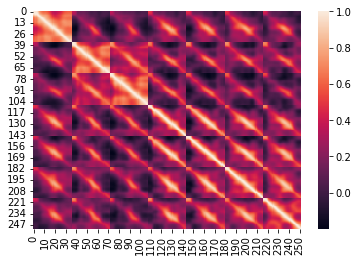

In [43]:
import seaborn as sns

data_corr = pd.DataFrame(X_train_scaled).corr()
sns.heatmap(data_corr)
plt.show()

In [44]:
import seaborn as sns
#sns.heatmap(pca.components_)
#print(sum(pca.components_[:,0]**2))

pca_map=pd.DataFrame(pca.components_,columns=feature_names,index=np.arange(1,253))
#pca.components_.shape
pca_map

,F7_0.5,F7_1.0,F7_1.5,F7_2.0,F7_2.5,F7_3.0,F7_3.5,F7_4.0,F7_4.5,F7_5.0,...,AF4_13.5,AF4_14.0,AF4_14.5,AF4_15.0,AF4_15.5,AF4_16.0,AF4_16.5,AF4_17.0,AF4_17.5,AF4_18.0
1,0.027016,0.028078,0.030068,0.033173,0.037045,0.039562,0.042160,0.045900,0.050295,0.054178,...,0.074719,0.070511,0.064970,0.059273,0.054172,0.049338,0.044873,0.041656,0.040573,0.041258
2,0.030717,0.031121,0.030710,0.028264,0.021043,0.012429,0.008031,0.001189,-0.008160,-0.016701,...,-0.030036,-0.015026,0.004169,0.020384,0.029701,0.034149,0.036184,0.036528,0.035116,0.032191
3,0.109818,0.112106,0.115832,0.121185,0.127125,0.129194,0.130314,0.130984,0.130990,0.131309,...,-0.068506,-0.063764,-0.058360,-0.054242,-0.052035,-0.050945,-0.050184,-0.049355,-0.047839,-0.045707
4,-0.010400,-0.007608,-0.001348,0.009771,0.027379,0.040233,0.039032,0.035958,0.036424,0.040319,...,-0.062946,-0.075697,-0.084154,-0.090211,-0.097790,-0.105974,-0.112837,-0.117346,-0.118374,-0.116328
5,0.138368,0.139680,0.140373,0.137923,0.127159,0.110776,0.102273,0.094364,0.084508,0.075465,...,0.037660,0.019567,-0.000962,-0.018218,-0.029692,-0.035480,-0.037033,-0.037971,-0.040471,-0.043819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,-0.017936,0.040214,-0.035078,0.017658,-0.007189,0.004486,-0.005723,0.012162,-0.021197,0.029103,...,-0.028355,0.017530,-0.010891,0.007487,-0.006263,0.005273,-0.002731,0.000300,0.000446,-0.000094
249,0.004765,-0.009786,0.007218,-0.002183,-0.000890,0.001915,-0.001810,0.000205,0.002846,-0.006525,...,-0.023751,0.013510,-0.008524,0.006256,-0.004724,0.003121,-0.001300,0.000071,-0.000037,0.000176
250,-0.002245,0.003622,0.000518,-0.003562,0.002604,-0.001120,0.000202,0.001406,-0.003604,0.005198,...,0.023253,-0.015178,0.009825,-0.006480,0.004310,-0.002799,0.001474,-0.000612,0.000036,-0.000017
251,0.001872,-0.006604,0.008249,-0.004986,0.001958,-0.000194,-0.001230,0.002669,-0.003627,0.003427,...,0.001875,-0.001818,0.000579,0.001148,-0.002869,0.003862,-0.003855,0.002706,-0.001155,0.000181


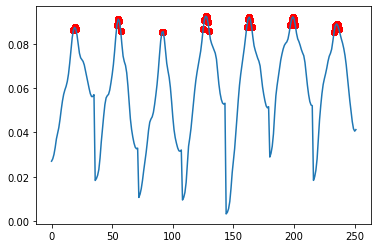

In [45]:
plt.plot(pca.components_[0,:])
x=np.where(pca.components_[0,:]>0.085)
x=np.array(x)
for i in x[0]:
    plt.scatter(x,pca.components_[0,x],c='r',label=feature_names[i])   
#plt.legend()
plt.show()

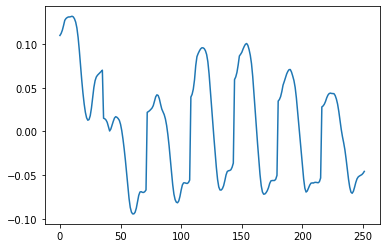

In [46]:
plt.plot(pca.components_[2,:])

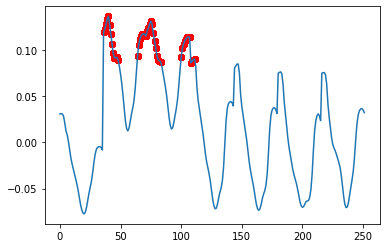

In [47]:
plt.plot(pca.components_[1,:])
x=np.where(pca.components_[1,:]>0.085)
x=np.array(x)
for i in x[0]:
    plt.scatter(x,pca.components_[1,x],c='r',label=feature_names[i])   
#plt.legend()
plt.show()

In [48]:
#USE SVM linear model
svm = SVC(kernel='linear')
svm.fit(X_train_scaled,data_train_target)
print(f'The Score for Training data with SVM Linear Model for all subjects:',svm.score(X_train_scaled,data_train_target))
print(f'Score of For Test data with SVM Linear Model for all subjects : {svm.score(X_test_scaled,data_test_target)}')

The Score for Training data with SVM Linear Model for all subjects: 0.7512696643131426
Score of For Test data with SVM Linear Model for all subjects : 0.7288079606920187


In [49]:
#Use RBF model
svm = SVC(kernel='rbf')
svm.fit(X_train_scaled,data_train_target)
print(f'The Score for Training data with SVM RBF Model for all subjects:',svm.score(X_train_scaled,data_train_target))
print(f'Score of For Test datawith SVM RBF Model for all subjects : {svm.score(X_test_scaled,data_test_target)}')

The Score for Training data with SVM RBF Model for all subjects: 0.9452495974235104
Score of For Test datawith SVM RBF Model for all subjects : 0.9298897559767125


In [50]:
svm = SVC(kernel='rbf')
svm.fit(X_train_pca[:,0:30],data_train_target)
print(f'The Score for Training data with SVM RBF Model for all subjects:',svm.score(X_train_pca[:,0:30],data_train_target))
print(f'Score of For Test data with SVM RBF Model for all subjects : {svm.score(X_test_pca[:,0:30],data_test_target)}')

The Score for Training data with SVM RBF Model for all subjects: 0.9178743961352657
Score of For Test data with SVM RBF Model for all subjects : 0.9050745282629341


In [51]:
#Try KNN Model
from sklearn.neighbors import KNeighborsClassifier
neighbor = KNeighborsClassifier(n_neighbors=3)
neighbor.fit(X_train_scaled,data_train_target)
print("the score for training with data from 5 participants:",neighbor.score(X_train_scaled,data_train_target))
print("the score for test data from 5 participants:",neighbor.score(X_test_scaled,data_test_target))

the score for training with data from 5 participants: 0.998389694041868
the score for test data from 5 participants: 0.9919484702093397


In [52]:
neighbor.fit(X_train_pca[:,0:30],data_train_target)
print("the score for training with data from 5 participants:",neighbor.score(X_train_pca[:,0:30],data_train_target))
print("the score for test data from 5 participants:",neighbor.score(X_test_pca[:,0:30],data_test_target))

the score for training with data from 5 participants: 0.9971509971509972
the score for test data from 5 participants: 0.9851769272059128


In [53]:
# decision trees
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(max_depth=16)
dt.fit(X_train_scaled,data_train_target)
print(f"the score for training with data from 5 participants:{dt.score(X_train_scaled,data_train_target)}")
print("the score for test data from 5 participants:",dt.score(X_test_scaled,data_test_target))

the score for training with data from 5 participants:0.9825963086832652
the score for test data from 5 participants: 0.8535447376027087


In [ ]:
from sklearn.ensemble import RandomForestClassifier

train_scores = []
test_scores = []
for depth in range(1,35):
    dt_reg = RandomForestClassifier(max_depth=depth,random_state=0)
    dt_reg.fit(X_train_scaled,data_train_target)
    train_scores = train_scores +[dt_reg.score(X_train_scaled,data_train_target)]
    test_scores = test_scores + [dt_reg.score(X_test_scaled,data_test_target)]
    
x = list(range(1,35))
plt.plot(x,train_scores,c='r',label='train')
plt.plot(x,test_scores,c='b',label='test')
plt.xlabel('depth')
plt.ylabel('accuracy')
plt.title('Depth vs. Accuracy for Random Forest Classifier')
plt.show()

In [ ]:
#from sklearn import tree

# graphviz.Source takes a graphviz object and turns it into an image. Graphviz is a
# standard graphical library/format for rendering graphs - nodes connected by edges -
# such as our decision tree below.
#graphviz.Source(tree.export_graphviz(dt,feature_names=feature_names))
#r=tree.export_text(dt, feature_names=feature_names)
#print(r)

# Use 5 folds cross validation 

In [ ]:
from sklearn.model_selection import KFold
import tensorflow as tf
tf.random.set_seed(0)
kfold = KFold(n_splits=5, shuffle=True)

data_train_target=data_train_target

fold_no = 1

score_tr=[]
score_cv=[]

svm = SVC(kernel='rbf')

for train,cv in kfold.split(X_train_scaled,data_train_target):
    X_tr = X_train_scaled[train]
    Y_tr = data_train_target[train]
    X_cv = X_train_scaled[cv]
    Y_cv = data_train_target[cv]
    
    tf.random.set_seed(0)
    
    svm.fit(X_tr,Y_tr)
    score_tr.append(svm.score(X_tr,Y_tr))
    score_cv.append(svm.score(X_cv,Y_cv))
    
    print(f'Score for {fold_no} Fold Training: {score_tr[-1]:.3f}')
    print(f'Score for {fold_no} Fold cv    : {score_cv[-1]:.3f}')
    print('----------------------------------')
    fold_no = fold_no + 1
    
print(f'Score of Average For Training: {np.mean(score_tr):.3f}')
print(f'Score of Average For CV.     : {np.mean(score_cv):.3f}')